In [1]:
#| hide

# This is to render Plotly plots into HTML
# For more information, see https://quarto.org/docs/interactive/widgets/jupyter.html#plotly
import plotly.io as pio
pio.renderers.default = "plotly_mimetype+notebook_connected"

import warnings
warnings.simplefilter('ignore')

import logging
logging.getLogger('statsforecast').setLevel(logging.ERROR)

In [2]:
import numpy as np
import pandas as pd

import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
plt.style.use('fivethirtyeight')
plt.rcParams['lines.linewidth'] = 1.5
dark_style = {
    'figure.facecolor': '#212946',
    'axes.facecolor': '#212946',
    'savefig.facecolor':'#212946',
    'axes.grid': True,
    'axes.grid.which': 'both',
    'axes.spines.left': False,
    'axes.spines.right': False,
    'axes.spines.top': False,
    'axes.spines.bottom': False,
    'grid.color': '#2A3459',
    'grid.linewidth': '1',
    'text.color': '0.9',
    'axes.labelcolor': '0.9',
    'xtick.color': '0.9',
    'ytick.color': '0.9',
    'font.size': 12 }
plt.rcParams.update(dark_style)

from pylab import rcParams
rcParams['figure.figsize'] = (18,7)
from statsforecast import StatsForecast




# End to End Walkthrough

> Model training, evaluation and selection for multiple time series

## Read the data

We will use pandas to read the M4 Hourly data set stored in a parquet file for efficiency. You can use ordinary pandas operations to read your data in other formats likes `.csv`. 

The input to StatsForecast is always a data frame in [long format](https://www.theanalysisfactor.com/wide-and-long-data/) with three columns: `unique_id`, `ds` and `y`:

* The `unique_id` (string, int or category) represents an identifier for the series. 

* The `ds` (datestamp or int) column should be either an integer indexing time or a datestampe ideally like YYYY-MM-DD for a date or YYYY-MM-DD HH:MM:SS for a timestamp.

* The `y` (numeric) represents the measurement we wish to forecast. The target column needs to be renamed to `y` if it has a different column name.

This data set already satisfies the requirements.  

Depending on your internet connection, this step should take around 10 seconds. 

In [3]:
def get_initial_final(df):
    min_i = df[df['y'].isna()].ds.min()
    max_i = df[df['y'].isna()].ds.max()
    inital, final = df[(df.ds < min_i)], df[(df.ds > max_i)]
    # reset the index
    inital.reset_index(drop=True, inplace=True)
    final.reset_index(drop=True, inplace=True)
    return inital, final

In [4]:

# write a function to read the data and convert the df to final
def read_data(data_path):
    df = pd.read_csv(data_path, parse_dates=['date'])
    final = pd.DataFrame()
    final['ds'] = pd.to_datetime(df['date'])
    final['y'] = df['load_data']
    final['unique_id'] = 'load_data'
    return final
path = 'final_output.csv'



In [5]:
df = read_data(path)

In [6]:
df.ds

0       2022-04-01 00:15:00
1       2022-04-01 00:30:00
2       2022-04-01 00:45:00
3       2022-04-01 01:00:00
4       2022-04-01 01:15:00
                ...        
49627   2023-08-31 23:00:00
49628   2023-08-31 23:15:00
49629   2023-08-31 23:30:00
49630   2023-08-31 23:45:00
49631   2023-09-01 00:00:00
Name: ds, Length: 49632, dtype: datetime64[ns]

## Explore Data with the plot method

In [7]:
StatsForecast.plot(df, engine = 'plotly')

In [131]:
# get the 1hr rolling mean df
df_1hr = df.copy()
df_1hr['y'] = df_1hr['y'].rolling(4).mean()
df_1hr.dropna(inplace=True)
df_1hr.head()
# index as ds
df_1hr.index = df_1hr['ds']


In [132]:
StatsForecast.plot(df_1hr, engine = 'plotly')

In [133]:
df.head()

,ds,y,unique_id
0,2022-04-01 00:15:00,16.07,load_data
1,2022-04-01 00:30:00,13.75,load_data
2,2022-04-01 00:45:00,13.13,load_data
3,2022-04-01 01:00:00,10.36,load_data
4,2022-04-01 01:15:00,9.96,load_data


In [134]:
# 
df_1hr = df.copy()    
df_1hr['y'] = df_1hr['y'].rolling(4).mean()



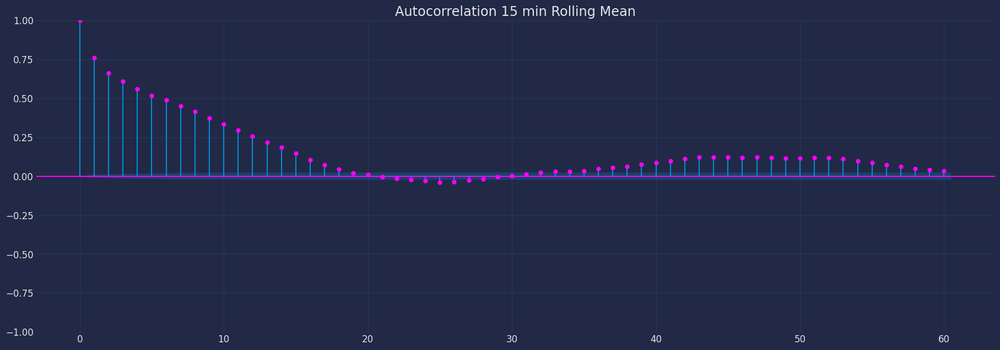

Text(0.5, 1.0, 'Partial Autocorrelation 15 min Rolling Mean')

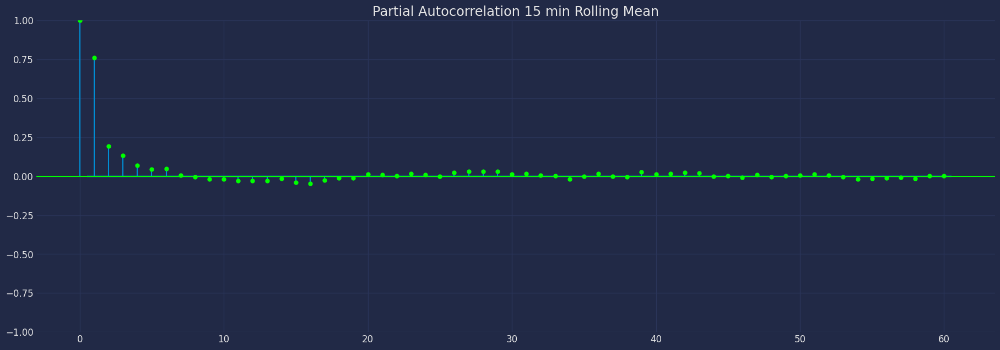

In [135]:
plt.figure(figsize=(20,7))
plot_acf(df["y"], lags=60, color="fuchsia", ax=plt.gca())
plt.title("Autocorrelation 15 min Rolling Mean")
plt.show();

plt.figure(figsize=(20,7))
plot_pacf(df["y"], lags=60, color="lime", ax=plt.gca())
plt.title("Partial Autocorrelation 15 min Rolling Mean")

### Train and Test Sets

In [8]:
df.set_index('ds', inplace=True)

In [9]:
# split the data into train and test
def split_data(df, train_ratio=0.8, test_ratio=0.2, validation_ratio=0.0):
    train_size = int(len(df) * train_ratio)
    test_size = int(len(df) * test_ratio)
    validation_size = int(len(df) * validation_ratio)
    train, test = df.iloc[0:train_size], df.iloc[train_size:train_size+test_size]
    validation = df.iloc[train_size+test_size:train_size+test_size+validation_size]
    return train, test, validation

In [10]:
train, test, validation = split_data(df, train_ratio=0.8, test_ratio=0.2, validation_ratio=0.0)

In [138]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(train['y'], order=(4,0,0))


<!-- i am using
 -->

In [152]:
from time import time
start = time()
model_fit = model.fit()
end = time()
print(f"time: - {end -start}")# fit the model

time: - 3.835327386856079


In [153]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                39705
Model:                 ARIMA(4, 0, 0)   Log Likelihood              -98540.258
Date:                Tue, 21 Nov 2023   AIC                         197092.516
Time:                        15:13:15   BIC                         197144.051
Sample:                             0   HQIC                        197108.834
                              - 39705                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         18.4113      0.087    212.621      0.000      18.242      18.581
ar.L1          0.5716      0.005    116.806      0.000       0.562       0.581
ar.L2          0.1074      0.006     19.129      0.000       0.096       0.118
ar.L3          0.0880      0.006     15.494      0.000       0.077       0.099
ar.L4          0.0622      0.005     12.492      0.000       0.052       0.072
sigma2         8.3789      0.057    146.350      0.000       8.267       8.491
===================================================================================
Ljung-Box (L1) (Q):                   0.23   Jarque-Bera (JB):               456.01
Prob(Q):                              0.63   Prob(JB):                         0.00
Heteroskedasticity (H):               1.00   Skew:                             0.24
Prob(H) (two-sided):                  0.96   Kurtosis:                         3.23
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

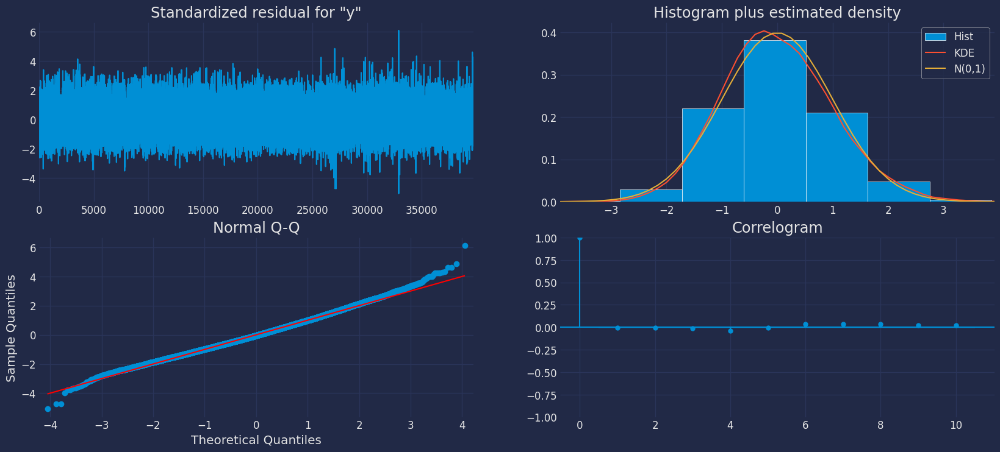

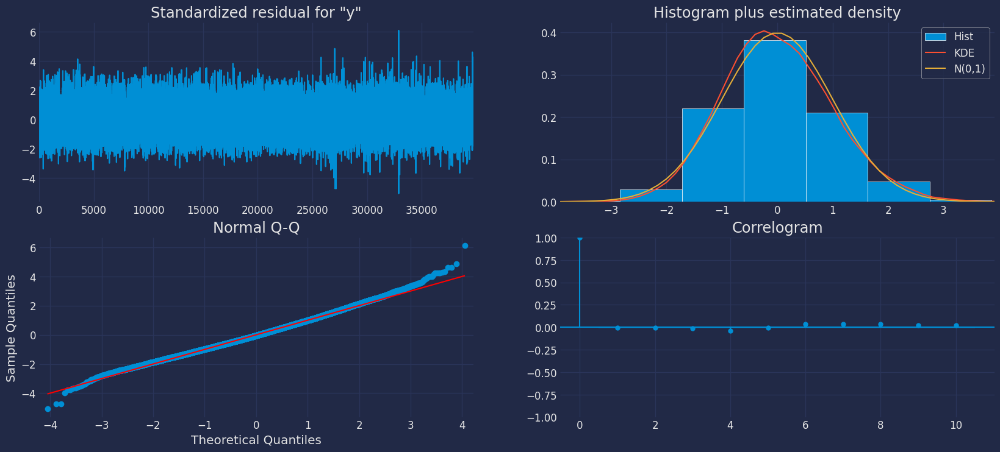

In [154]:
model_fit.plot_diagnostics(figsize=(18, 8))

In [162]:
start_date, end_date = test.index.min(), test.index.min() + pd.Timedelta(days=2)

In [161]:
print(test.index.min(), train.index.max())

2023-05-20 14:30:00 2023-05-20 14:15:00


In [ ]:
predictions = model_fit.predict(start=start_date, end= end_date)

In [88]:
predictions

39705    21.545317
39706    21.081608
39707    20.838441
39708    20.677024
39709    20.537918
           ...    
49626    18.405956
49627    18.405956
49628    18.405956
49629    18.405956
49630    18.405956
Name: predicted_mean, Length: 9926, dtype: float64

In [97]:
# add predictions to the test df
test['predictions'] = predictions

In [85]:
residuals = test['y'] - predictions

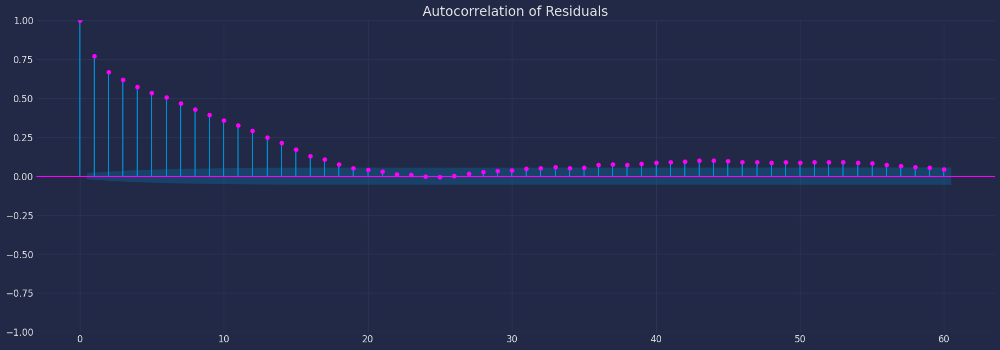

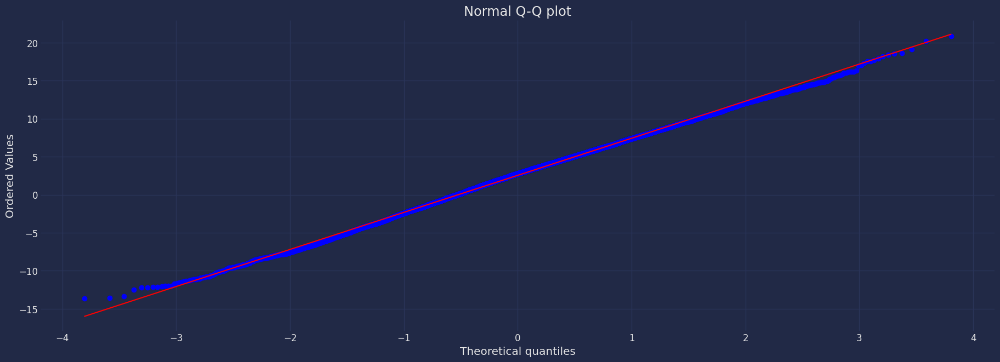

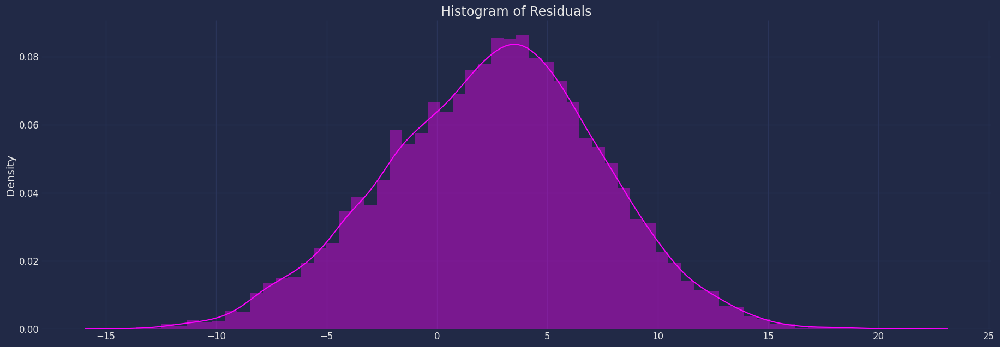

In [93]:
# residual dioagnostic plot
plt.figure(figsize=(20,7))
plot_acf(residuals, lags=60, color="fuchsia", ax=plt.gca())
plt.title("Autocorrelation of Residuals")
plt.show();

# qq plot
plt.figure(figsize=(20,7))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Normal Q-Q plot")
plt.show();

# histogram kde wrt normal distribution
plt.figure(figsize=(20,7))
sns.distplot(residuals, bins=60, color="fuchsia", hist_kws={'alpha': 0.4});
plt.title("Histogram of Residuals")
plt.show();




In [104]:
test.head()

,y,unique_id,predictions
ds,,,
2023-05-20 14:30:00,20.38572,load_data,21.545317
2023-05-20 14:45:00,17.32848,load_data,21.081608
2023-05-20 15:00:00,18.15272,load_data,20.838441
2023-05-20 15:15:00,23.35792,load_data,20.677024
2023-05-20 15:30:00,23.35652,load_data,20.537918


In [114]:
predict = pd.DataFrame({'ds': test.index, 'y': test['predictions'], 'unique_id': 'load_data'})
predict.head()

,ds,y,unique_id
ds,,,
2023-05-20 14:30:00,2023-05-20 14:30:00,21.545317,load_data
2023-05-20 14:45:00,2023-05-20 14:45:00,21.081608,load_data
2023-05-20 15:00:00,2023-05-20 15:00:00,20.838441,load_data
2023-05-20 15:15:00,2023-05-20 15:15:00,20.677024,load_data
2023-05-20 15:30:00,2023-05-20 15:30:00,20.537918,load_data


In [115]:
plotly_fig = StatsForecast.plot(predict, engine = 'plotly')
plotly_fig.show()


In [ ]:
# white noise residual plot -normal distribution and correlation of lagged residuals is zero, correlogram
# fit a auto regressive model to the data and check the residuals
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error
AutoReg(df_1hr['y'], lags=1).fit().summary()

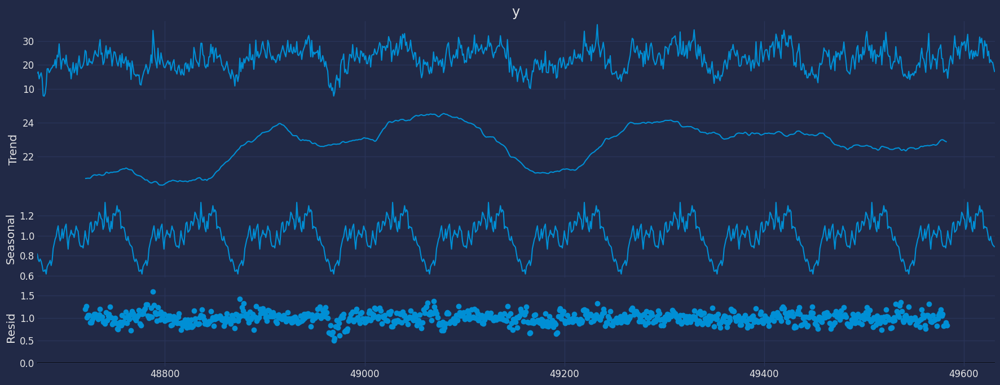

In [23]:
# decompose the time series
from statsmodels.tsa.seasonal import seasonal_decompose 
a = seasonal_decompose(df["y"][-96*10:], model = "multiplicate", period=24*4)
a.plot();


### Split the data into training and testing
Let’s divide our data into sets 1. Data to train our **AutoArima** model 2. Data to test our model

For the test data we will use the last 12 months to test and evaluate the performance of our model.

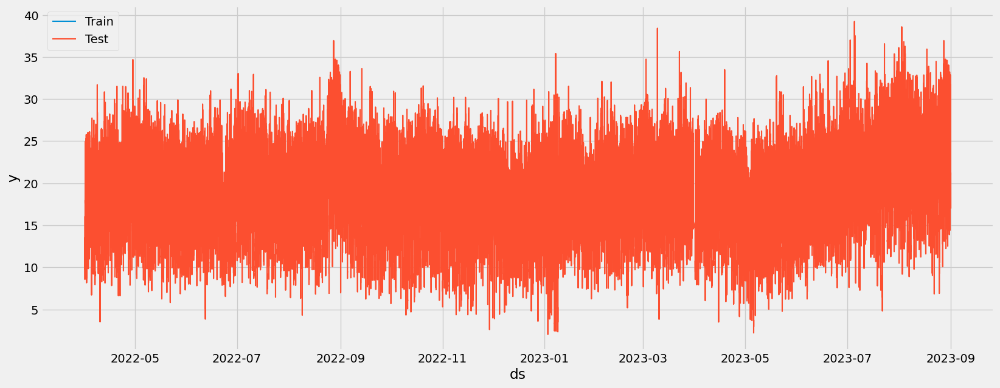

In [12]:
sns.lineplot(Y_train_df,x="ds", y="y", label="Train")
sns.lineplot(Y_test_df, x="ds", y="y", label="Test")
plt.show()


**statistical models**  <br>
 ['AutoARIMA', 'ETS', 'SimpleExponentialSmoothing', 'SimpleExponentialSmoothingOptimized', 'SeasonalExponentialSmoothing', 'SeasonalExponentialSmoothingOptimized', 'HistoricAverage', 'Naive','RandomWalkWithDrift', 'SeasonalNaive', 'WindowAverage', 'SeasonalWindowAverage', 'ADIDA', 'CrostonClassic', 'CrostonOptimized', 'CrostonSBA', 'IMAPA', 'TSB']

In [11]:
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA
from statsforecast.arima import arima_string


## Train multiple models for many series

StatsForecast can train many models on many time series efficiently. 

Start by importing and instantiating the desired models. StatsForecast offers a wide variety of models grouped in the following categories:

*  **Auto Forecast:** Automatic forecasting tools search for the best parameters and select the best possible model for a series of time series. These tools are useful for large collections of univariate time series. Includes automatic versions of: Arima, ETS, Theta, CES.

* **Exponential Smoothing:**  Uses a weighted average of all past observations where the weights decrease exponentially into the past. Suitable for data with no clear trend or seasonality. Examples: SES, Holt's Winters, SSO.

* **Benchmark models:** classical models for establishing baselines. Examples: Mean, Naive, Random Walk

* **Intermittent or Sparse models:** suited for series with very few non-zero observations. Examples: CROSTON, ADIDA, IMAPA

* **Multiple Seasonalities:** suited for signals with more than one clear seasonality. Useful for low-frequency data like electricity and logs. Examples: MSTL. 

* **Theta Models:**  fit two theta lines to a deseasonalized time series, using different techniques to obtain and combine the two theta lines to produce the final forecasts. Examples: Theta, DynamicTheta

Here you can check the complete list of [models](../../src/core/models.ipynb) .

For this example we will use:

* `AutoARIMA`: Automatically selects the best ARIMA (AutoRegressive Integrated Moving Average) model using an information criterion. Ref: `AutoARIMA`.

* `HoltWinters`: triple exponential smoothing, Holt-Winters' method is an extension of exponential smoothing for series that contain both trend and seasonality. Ref: `HoltWinters`

* `SeasonalNaive`: Memory Efficient Seasonal Naive predictions. Ref: `SeasonalNaive`

* `HistoricAverage`: arthimetic mean. Ref: `HistoricAverage`.

* `DynamicOptimizedTheta`: The theta family of models has been shown to perform well in various datasets such as M3. Models the deseasonalized time series. Ref: `DynamicOptimizedTheta`.

Import and instantiate the models. Setting the `season_length` argument is sometimes tricky. This article on [Seasonal periods](https://robjhyndman.com/hyndsight/seasonal-periods/)) by the master, Rob Hyndmann, can be useful. 

In [12]:
from statsforecast.models import (
    AutoARIMA,
    HoltWinters,
    CrostonClassic as Croston, 
    HistoricAverage,
    DynamicOptimizedTheta as DOT,
    SeasonalNaive
)

In [13]:
# Create a list of models and instantiation parameters
models = [
    AutoARIMA(season_length=96),
    HoltWinters(),
    Croston(),
    SeasonalNaive(season_length=96),
    HistoricAverage(),
    DOT(season_length=96)
]

We fit the models by instantiating a new `StatsForecast` object with the following parameters:

* `models`: a list of models. Select the models you want from [models](../../src/core/models.ipynb)  and import them.

* `freq`: a string indicating the frequency of the data. (See [pandas available frequencies](https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#offset-aliases).)

* `n_jobs`: n_jobs: int, number of jobs used in the parallel processing, use -1 for all cores.

* `fallback_model`: a model to be used if a model fails. 


Any settings are passed into the constructor. Then you call its fit method and pass in the historical data frame.


In [14]:
# Instantiate StatsForecast class as sf
sf = StatsForecast(
    models=models,
    freq='15T', 
    n_jobs=-1,
    fallback_model = SeasonalNaive(season_length=96)
)

In [52]:
path = 'final_output.csv'
data = read_data(path)


In [15]:
train, test, validation

(                            y  unique_id
 ds                                      
 2022-04-01 00:15:00  16.07000  load_data
 2022-04-01 00:30:00  13.75000  load_data
 2022-04-01 00:45:00  13.13000  load_data
 2022-04-01 01:00:00  10.36000  load_data
 2022-04-01 01:15:00   9.96000  load_data
 ...                       ...        ...
 2023-05-20 13:15:00  19.36884  load_data
 2023-05-20 13:30:00  21.67044  load_data
 2023-05-20 13:45:00  21.79356  load_data
 2023-05-20 14:00:00  19.62288  load_data
 2023-05-20 14:15:00  22.53540  load_data
 
 [39705 rows x 2 columns],
                              y  unique_id
 ds                                       
 2023-05-20 14:30:00  20.385720  load_data
 2023-05-20 14:45:00  17.328480  load_data
 2023-05-20 15:00:00  18.152720  load_data
 2023-05-20 15:15:00  23.357920  load_data
 2023-05-20 15:30:00  23.356520  load_data
 ...                        ...        ...
 2023-08-31 22:45:00  20.931210  load_data
 2023-08-31 23:00:00  22.181190  load_

In [17]:
train.head()

,y,unique_id
ds,,
2022-04-01 00:15:00,16.07,load_data
2022-04-01 00:30:00,13.75,load_data
2022-04-01 00:45:00,13.13,load_data
2022-04-01 01:00:00,10.36,load_data
2022-04-01 01:15:00,9.96,load_data


In [22]:
train['ds']

0       2022-04-01 00:15:00
1       2022-04-01 00:30:00
2       2022-04-01 00:45:00
3       2022-04-01 01:00:00
4       2022-04-01 01:15:00
                ...        
39700   2023-05-20 13:15:00
39701   2023-05-20 13:30:00
39702   2023-05-20 13:45:00
39703   2023-05-20 14:00:00
39704   2023-05-20 14:15:00
Name: ds, Length: 39705, dtype: datetime64[ns]

In [21]:
# drop index
train.reset_index(inplace=True, drop=False)

In [23]:
# Fit the model
sf.fit(train[-1000:])

ValueError: Nonseasonal data

:::{.callout-note}
StatsForecast achieves its blazing speed using JIT compiling through Numba. The first time you call the statsforecast class, the fit method should take around 5 seconds. The second time -once Numba compiled your settings- it should take less than 0.2s. 
:::


The `forecast` method takes two arguments: forecasts next `h` (horizon) and `level`.

* `h` (int): represents the forecast h steps into the future. In this case, 12 months ahead. 

* `level` (list of floats): this optional parameter is used for probabilistic forecasting. Set the `level` (or confidence percentile) of your prediction interval. For example, `level=[90]` means that the model expects the real value to be inside that interval 90% of the times. 

The forecast object here is a new data frame that includes a column with the name of the model and the y hat values, as well as columns for the uncertainty intervals. Depending on your computer, this step should take around 1min. (If you want to speed things up to a couple of seconds, remove the AutoModels like ARIMA and Theta)

:::{.callout-note}
The `forecast` method is compatible with distributed clusters, so it does not store any model parameters. If you want to store parameters for every model you can use the `fit` and `predict` methods. However, those methods are not defined for distrubed engines like Spark, Ray or Dask.
:::

In [ ]:
forecasts_df = sf.forecast(h=96, level=[90] , fitted= True)
forecasts_df.head()

KeyboardInterrupt: 

Plot the results of 8 random series using the `StatsForecast.plot` method. 

In [ ]:
sf.fit()
forecast_df = sf.predict(h=96, level=[90]) 

forecast_df.tail()

ValueError: Nonseasonal data

In [ ]:
sf.plot(train[-100:],forecasts_df, engine='plotly')

The `StatsForecast.plot` allows for further customization. For example, plot the results of the different models and unique ids. 

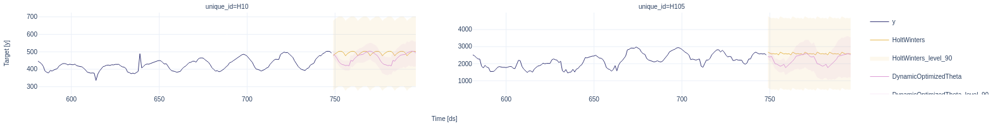

In [ ]:
# Plot to unique_ids and some selected models
sf.plot(Y_df, forecasts_df, models=["HoltWinters","DynamicOptimizedTheta"], unique_ids=["H10", "H105"], level=[90], engine='plotly')

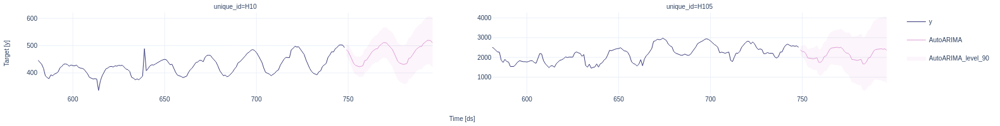

In [ ]:
# Explore other models 
sf.plot(Y_df, forecasts_df, models=["AutoARIMA"], unique_ids=["H10", "H105"], level=[90], engine='plotly')

## Evaluate the model's performance


In previous steps, we've taken our historical data to predict the future. However, to asses its accuracy we would also like to know how the model would have performed in the past. To assess the accuracy and robustness of your models on your data perform Cross-Validation.

With time series data, **Cross Validation** is done by defining a sliding window across the historical data and predicting the period following it. This form of cross-validation allows us to arrive at a better estimation of our model's predictive abilities across a wider range of temporal instances while also keeping the data in the training set contiguous as is required by our models.

The following graph depicts such a Cross Validation Strategy:

![](https://raw.githubusercontent.com/Nixtla/statsforecast/main/nbs/imgs/ChainedWindows.gif)

Cross-validation of time series models is considered a best practice but most implementations are very slow. The statsforecast library implements cross-validation as a distributed operation, making the process less time-consuming to perform. If you have big datasets you can also perform Cross Validation in a distributed cluster using Ray, Dask or Spark. 

In this case, we want to evaluate the performance of each model for the last 2 days (n_windows=2), forecasting every second day (step_size=48).  Depending on your computer, this step should take around 1 min. 

:::{.callout-tip}
Setting `n_windows=1` mirrors a traditional train-test split with our historical data serving as the training set and the last 48 hours serving as the testing set. 
:::

The `cross_validation` method from the `StatsForecast` class takes the following arguments.

* `df`: training data frame 

* `h` (int): represents h steps into the future that are being forecasted. In this case, 24 hours ahead. 

* `step_size` (int): step size between each window. In other words: how often do you want to run the forecasting processes. 

* `n_windows`(int): number of windows used for cross validation. In other words: what number of forecasting processes in the past do you want to evaluate.


In [ ]:
crossvaldation_df = sf.cross_validation(
    df=data,
    h=24,
    step_size=24,
    n_windows=2
  )

The crossvaldation_df object is a new data frame that includes the following columns:

* `unique_id` index: (If you dont like working with index just run `forecasts_cv_df.resetindex()`)

* `ds`: datestamp or temporal index 

* `cutoff`: the last datestamp or temporal index for the `n_windows.` If `n_windows=1`, then one unique cuttoff value, if `n_windows=2` then two unique cutoff values. 

* `y`: true value 

* `"model"`: columns with the model's name and fitted value. 


In [ ]:
crossvaldation_df.head()

,ds,cutoff,y,AutoARIMA,HoltWinters,CrostonClassic,SeasonalNaive,HistoricAverage,DynamicOptimizedTheta
unique_id,,,,,,,,,
H1,701,700,619.0,603.925415,847.0,742.668762,691.0,661.674988,612.767517
H1,702,700,565.0,507.591736,820.0,742.668762,618.0,661.674988,536.846252
H1,703,700,532.0,481.281677,790.0,742.668762,563.0,661.674988,497.824280
H1,704,700,495.0,444.410248,784.0,742.668762,529.0,661.674988,464.723236
H1,705,700,481.0,421.168762,752.0,742.668762,504.0,661.674988,440.972351


Next, we will evaluate the performance of every model for every series using common error metrics like Mean Absolute Error (MAE) or Mean Square Error (MSE)
Define a utility function to evaluate different error metrics for the cross validation data frame. 

First import the desired error metrics from `mlforecast.losses`. Then define a utility function that takes a cross-validation data frame as a metric and returns an evaluation data frame with the average of the error metric for every unique id and fitted model and all cutoffs. 

In [ ]:
from utilsforecast.losses import mse
from utilsforecast.evaluation import evaluate

In [ ]:
def evaluate_cross_validation(df, metric):
    models = df.drop(columns=['unique_id', 'ds', 'cutoff', 'y']).columns.tolist()
    evals = []
    # Calculate loss for every unique_id and cutoff.    
    for cutoff in df['cutoff'].unique():
        eval_ = evaluate(df[df['cutoff'] == cutoff], metrics=[metric], models=models)
        evals.append(eval_)
    evals = pd.concat(evals)
    evals = evals.groupby('unique_id').mean(numeric_only=True) # Averages the error metrics for all cutoffs for every combination of model and unique_id
    evals['best_model'] = evals.idxmin(axis=1)
    return evals

:::{.callout-warning}
You can also use Mean Average Percentage Error (MAPE), however for granular forecasts, MAPE values are extremely [hard to judge](https://blog.blueyonder.com/mean-absolute-percentage-error-mape-has-served-its-duty-and-should-now-retire/) and not useful to assess forecasting quality.
:::

Create the data frame with the results of the evaluation of your cross-validation data frame using a Mean Squared Error metric. 

In [ ]:
evaluation_df = evaluate_cross_validation(crossvaldation_df.reset_index(), mse)

evaluation_df.head()

,AutoARIMA,HoltWinters,CrostonClassic,SeasonalNaive,HistoricAverage,DynamicOptimizedTheta,best_model
unique_id,,,,,,,
H1,1979.302124,44888.019531,28038.736328,1422.666748,20927.664062,1296.333984,DynamicOptimizedTheta
H10,458.892700,2812.916504,1483.484131,96.895828,1980.367432,379.621124,SeasonalNaive
H100,8629.948242,121625.375000,91945.140625,12019.000000,78491.187500,21699.648438,AutoARIMA
H101,6818.348633,28453.394531,16183.634766,10944.458008,18208.404297,63698.082031,AutoARIMA
H102,65489.964844,232924.843750,132655.296875,12699.896484,309110.468750,31393.519531,SeasonalNaive


Create a summary table with a model column and the number of series where that model performs best. In this case, the Arima and Seasonal Naive are the best models for 10 series and the Theta model should be used for two.

In [ ]:
summary_df = evaluation_df.groupby('best_model').size().sort_values().to_frame()

summary_df.reset_index().columns = ["Model", "Nr. of unique_ids"]

You can further explore your results by plotting the unique_ids where a specific model wins.

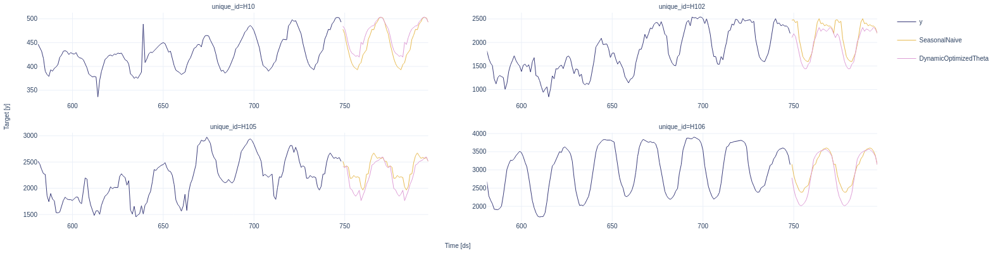

In [ ]:
seasonal_ids = evaluation_df.query('best_model == "SeasonalNaive"').index

sf.plot(Y_df,forecasts_df, unique_ids=seasonal_ids, models=["SeasonalNaive","DynamicOptimizedTheta"], engine='plotly')

## Select the best model for every unique series

Define a utility function that takes your forecast's data frame with the predictions and the evaluation data frame and returns a data frame with the best possible forecast for every unique_id.

In [ ]:
def get_best_model_forecast(forecasts_df, evaluation_df):
    df = forecasts_df.set_index('ds', append=True).stack().to_frame().reset_index(level=2) # Wide to long 
    df.columns = ['model', 'best_model_forecast'] 
    df = df.join(evaluation_df[['best_model']])
    df = df.query('model.str.replace("-lo-90|-hi-90", "", regex=True) == best_model').copy()
    df.loc[:, 'model'] = [model.replace(bm, 'best_model') for model, bm in zip(df['model'], df['best_model'])]
    df = df.drop(columns='best_model').set_index('model', append=True).unstack()
    df.columns = df.columns.droplevel()
    df = df.reset_index(level=1)
    return df

Create your production-ready data frame with the best forecast for every unique_id.

In [ ]:
prod_forecasts_df = get_best_model_forecast(forecasts_df, evaluation_df)

prod_forecasts_df.head()

model,ds,best_model,best_model-hi-90,best_model-lo-90
unique_id,,,,
H1,749,592.701843,611.652649,577.677307
H1,750,525.589111,546.621826,505.449738
H1,751,489.251801,512.424133,462.072876
H1,752,456.195038,478.260956,430.554291
H1,753,436.290527,461.815948,411.051239


Plot the results. 

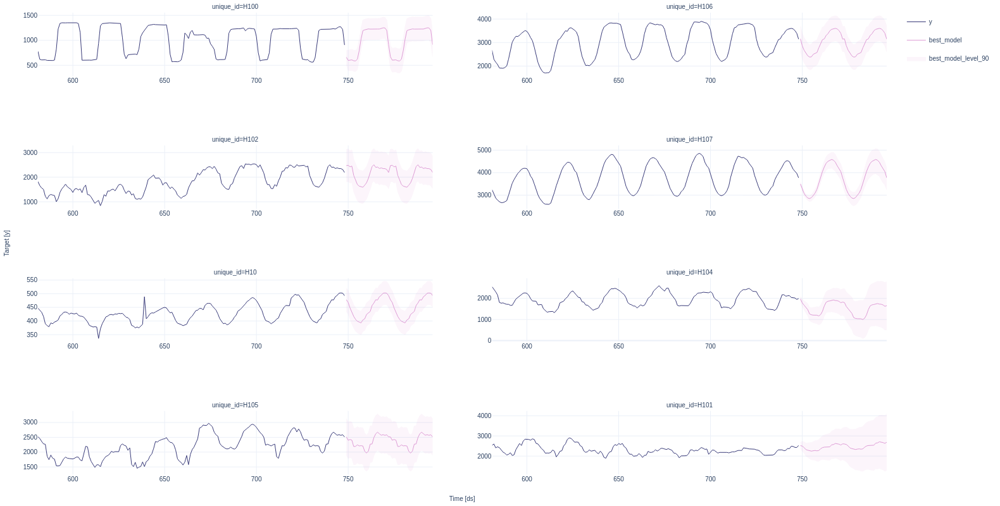

In [ ]:
sf.plot(Y_df, prod_forecasts_df, level=[90], engine='plotly')